# Elder Scrolls IV: Oblivion character network analysis

#### In this notebook we extract character data from Elder Scrolls IV: Oblivion through an [elder scrolls fandom wiki](https://elderscrolls.fandom.com) and then analyze the characters through network analysis and data visualizations.

**Imports**

In [1]:
import os
import re
import json
import scipy
import numpy as np
import pandas as pd
from tabulate import tabulate

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")

import networkx as nx
import urllib.request
from tqdm.auto import tqdm

import nltk
from nltk.tokenize import WordPunctTokenizer
from nltk.stem import WordNetLemmatizer
tokenizer = WordPunctTokenizer()
lemmatizer = WordNetLemmatizer()
stopwords = nltk.corpus.stopwords.words('english')
from nltk import sentiment
from nltk.sentiment import vader
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import PlaintextCorpusReader
from nltk.probability import FreqDist
from nltk import word_tokenize
from wordcloud import WordCloud
from PIL import Image

## Identify list of characters to put into network

We use the elder scrolls wiki to make a url request to the website, and then load the websites as json, and use regular expressions to identify character names to pull. Then we download each individual character's descriptions and save them into a dataframe.

There are numerous extra links that we need to manually remove (otherwise we must add more regular expressions).

In [2]:
# use this to get the list of discrete characters from oblivion
baseurl='https://elderscrolls.fandom.com/api.php?'
action = "action=query"
title = "titles=Characters_(Oblivion)"
# content = "prop=extracts&exlimit=1&explaintext"
content = "prop=revisions&rvprop=content&rvslots=*"
dataformat ="format=json"


#construct query
charquery = "{}{}&{}&{}&{}".format(baseurl, action, content, title, dataformat)
charwikiresponse = urllib.request.urlopen(charquery)
charwikidata = charwikiresponse.read()
charwikitext = charwikidata.decode('utf-8')
# print(charquery)

# json load
charwikijson=json.loads(charwikitext)
pageid = list(charwikijson['query']['pages'].keys())[0]
nicechar = charwikijson['query']['pages'][pageid]['revisions'][0]['slots']['main']['*']
# print(nicechar)

# patterns to find character names
# patternbracket = '\[\[(.*?)(?:\|.*?)?\]\]'
pattern1 = '\[\[(.*?)(?:\.png\|.*?)?\]\]'
pattern2 = '\[\[(.*?)(?:#.*?)?(?:\|.*?)?\]\]'
# patternfile = '\[\[(?:File:)(.*?)\]\]'
patterns = [pattern1, pattern2] # ,patternfile]
# need to exclude things with File: before, and .png after

for pattern in patterns:
    charnames = re.findall(pattern, nicechar)
    
## TEMPORARY CLEANING UNTIL I FIGURE OUT THE REGEX ##
# clean up File names
charnames = [i for i in charnames if not ('File:' in i)]

# remove extraneous names
mistakes = ['Cyrodiil','Races (Oblivion)|races', 'Merchants (Oblivion)|Merchants', "Spell Merchants (Oblivion)|Spell Merchants",
             'Trainers (Oblivion)|Trainers', "Houses (Oblivion)|house", 'Heal (Oblivion)|healed', "Spells (Oblivion)|spell",
            'demoralize', "Sheogorath's Shrine (Oblivion)|Sheogorath's Shrine", 'Arcane University (Oblivion)|Arcane University',
            'Imperial City', 'Mystic Emporium', 'Brindle Home', 'Imperial City Waterfront', 'Divine Elegance',
            'Bravil (Oblivion)|Bravil' , "A Warlock's Luck", 'Vahtacen (Oblivion)|Vahtacen', 'The Dividing Line',
            "The Archer's Paradox (Oblivion)|The Archer's Paradox", 'Best Goods and Guarantees', 'First Edition (Location)|First Edition',
            "Water's Edge", 'The Main Ingredient', "Lelles' Quality Merchandise", 'The Flowin Bowl', "The Fo'c's'le",
            'Northern Goods and Trade', 'Silverhome on the Water', "The Serpent's Wake", 'The Gilded Carafe',
             'The Flowing Bowl', "The Archer's Paradox (Oblivion)",  "Morvayn's Peacemakers", "Harm's Folly", 
            'The Foaming Flask', 'Knights of the Thorn Medallion', "Fisherman's Rock", 'Cropsford', "Bleak Mine",
            'County', 'Wayshrine of Kynareth'
           ]

#removals
for name in charnames:
    if name in mistakes:
        charnames.remove(name)
    if 'Cave' in name or 'Castle' in name or 'Inn' in name or 'Gate' in name or 'Guild' in name or 'Fort' in name \
    or 'Sanctuary' in name or 'Tower' in name or 'Chapel' in name or 'House' in name or 'Stables' in name \
    or 'Manor' in name or 'Shrine' in name or 'Temple' in name or 'Leyawiin' in name or 'Cheydinhal' in name \
    or 'Camp' in name or 'Applewatch' in name or 'Arena District' in name or 'Gold Road' in name or 'Hackdirt' in name\
    or 'Prison' in name or "Harlun's Watch" in name or 'Bruma' in name or 'Anvil' in name or 'Lodge' in name \
    or 'Skingrad' in name or 'Bruma' in name or 'Chorrol' in name or 'Bravil' in name or 'University' in name \
    or 'Mine' in name or 'Blackwood' in name or '(Location)' in name or 'District' in name or 'Priory' in name \
    or 'Shack' in name or 'Estate' in name or 'Farm' in name or 'Characters' in name or 'Category' in name:
        charnames.remove(name)
    
#manual removals - don't work above for some reason
charnames.remove('Races (Oblivion)')
charnames.remove('Spell Merchants (Oblivion)')
charnames.remove('Merchants (Oblivion)')
charnames.remove('Spells (Oblivion)')
charnames.remove('Trainers (Oblivion)')
charnames.remove('Heal (Oblivion)')
# don't remove Hero of Kvatch
charnames.remove('Kvatch (Oblivion)')
charnames.remove('FIle:Merandil.png')
charnames.remove('FIle:Eridor.png')
# charnames.remove('Bleak Mine')
charnames.remove('Vampire (Oblivion)')
charnames.remove('Characters (Redguard)')
charnames.remove('Characters (Skyrim)')
charnames.remove('Bleak Mine')
charnames.remove('Category:Oblivion: Characters')
charnames.remove('County')
charnames.remove('City Watch')
charnames.remove('Bandits (Oblivion)')
charnames.remove('The Bloated Float')
charnames.remove("Bleaker's Way (Oblivion)")
charnames.remove("Kvatch (Oblivion)")
# find characters that were not in this page and manually re-add them!
charnames.append('Antoinetta Marie')


# save the characters into a df and list
df_characters = pd.DataFrame(charnames,columns={'Name'})
list_characters = charnames

## Save each character's wiki page in a txt file if necessary.

In [3]:
# ##SAVE EACH CHARACTERS PLAIN TEXT TXT FILE
# # setup URL information
# baseurl='https://elderscrolls.fandom.com/api.php?'
# action = "action=query"
# # title = "titles=Characters_(Oblivion)"
# content = "prop=extracts&exlimit=1&explaintext"
# dataformat ="format=json"

# # loop through the Name column of df_characters and for each name make a request to the API
# for character in df_characters.Name:
#     title = ('titles=')+urllib.parse.quote_plus(character)
#     title = title.replace(' ','_')
#     query = "{}{}&{}&{}&{}".format(baseurl, action, content, title, dataformat)
#     # open each page
#     wikiresponse = urllib.request.urlopen(query)
#     wikidata = wikiresponse.read()
#     wikitext = wikidata.decode('utf-8')
#     wikijson=json.loads(wikitext)
#     pageid = list(wikijson['query']['pages'].keys())[0]

#     # pull only the plain text from each page
#     description = wikijson['query']['pages'][pageid]['extract']

#     # create a new file for each character
#     file = open('/Users/alaina/Oblivion/'+character+'.txt','w')
#     file.write(description)
#     file.close()
#     print('this character''s file has been created!',character)


## Function to load wikipedia page, so that we can open pages and find links/attributes later

In [4]:
# function to query wikipedia based on an input page, and then it returns the character description
def query_wikipedia(page_name):
    baseurl = "https://elderscrolls.fandom.com/api.php?"
    action = "action=query"
    title = ('titles=')+urllib.parse.quote_plus(page_name).replace(' ','_')
    content = "prop=revisions&rvprop=content&rvslots=*"
    dataformat ="format=json"

    query = "{}{}&{}&{}&{}".format(baseurl, action, content, title, dataformat)
    wikiresponse = urllib.request.urlopen(query)
    wikidata = wikiresponse.read()
    wikitext = wikidata.decode('utf-8')
    wikijson = json.loads(wikitext)

    pageid = list(wikijson['query']['pages'].keys())[0]
    description = wikijson['query']['pages'][pageid]['revisions'][0]['slots']['main']['*']
    
    return description

### Function to find links to other characters in a given character's description.

In [5]:
# use regex to identify what characters a specific character links to
def get_links(text):
    link_pattern = r'\[\[(.*?)(?:#.*?)?(?:\|.*?)?\]\]'
    links = re.findall(link_pattern, text)
    links = [link for link in links if link in list_characters] # To compare/filter only characters
    links = list(dict.fromkeys(links)) # Remove duplicate
    return links

Test the get_links function by seeing who Ocheeva links to.

In [6]:
print('Ocheeva links to:',get_links(query_wikipedia('Ocheeva')))

Ocheeva links to: ['Teinaava', 'Lucien Lachance (Oblivion)', 'Uriel Septim VII', 'Scar-Tail', 'Mathieu Bellamont', 'Faelian', 'Adamus Phillida', 'Roderick']


## Function to retrieve attributes of characters within their wiki pages

We use regular expressions to extract the race, gender, faction, and essential status of each character.

In [7]:
# save the attributes of each character in a dict
def get_attributes(text):
    attr = {}
    
    # 1. Race
    race_pattern = r'race\s*=\s*(\w*)'
    race = re.findall(race_pattern, text)
    if not race:
        attr['race'] = 'Unknown'
    else:
        attr['race'] = race[0]
        
    # 2. Gender
    gender_pattern = r'gender\s*=\s*(\w*)'
    gender = re.findall(gender_pattern, text)
    if not gender:
        attr['gender'] = 'Unknown'
    else:
        attr['gender'] = gender[0]
        
    # 3. Faction
    faction_pattern = r'faction\s*=\s*(\w*)\[\[?(.*?)(?:\s\(|\||\]\])'
    factions = re.findall(faction_pattern, text)
    if not factions:
        attr['faction'] = 'None'
    else:
        for faction in factions:
            attr['faction'] = faction[1]
    
    # 4. Essential
    essential_pattern = r'essential\s*=\s*(\w*)'
    essential = re.findall(essential_pattern, text)
    if not essential:
        attr['essential'] = 'Unknown'
    else:
        attr['essential'] = essential[0]
    
    return attr

Test the attribute function with Ocheeva.

In [8]:
# test if it works with Ocheeva
get_attributes(query_wikipedia('Ocheeva'))

{'race': 'Argonian',
 'gender': 'Female',
 'faction': 'Dark Brotherhood',
 'essential': 'Yes'}

## Function to prepare the network by using our function to query wikipedia, retrieve the attributes, and retrieve the links between each node.

In [9]:
# use our prior functions to create the network. return the node attributes and edges
def prepare_network(list_nodes):
    nodes_attributes = {}
    nodes_edges = {}
    for node in tqdm(list_nodes):
        node_filename = "/Users/alaina/Oblivion/"+node.replace('/','_')+".txt"
        
        if os.path.isfile(node_filename):
            try:
                with open(node_filename, "r") as f:
                    description = f.read()
            except:
                print('Reading .txt file failed:', node)
        else:
            print('Query wikipedia for', node)
            description = query_wikipedia(node)
            try:
                with open(node_filename,"w") as f:
                    f.write(description)
            except:
                print('Writing .txt file failed:', node)
    
        attributes = get_attributes(description)
        targets = get_links(description)

        nodes_attributes[node] = attributes
        nodes_edges[node] = targets
        
    return nodes_attributes, nodes_edges

In [10]:
# finally, build the dicts that store the attributes and edges
nodes_attributes, nodes_edges = prepare_network(list_characters)

  0%|          | 0/888 [00:00<?, ?it/s]

### Turn the dictionary of node attributes and edges into a network with networkx

We will build both a directed graph and an undirected graph.

In [11]:
# build the network given a list of node attributes and edges
def build_network(nodes_attributes, nodes_edges):                      
    # ---=== Create GRAPH ===---
    G = nx.DiGraph()  
    # Create nodes
    for node, attr in nodes_attributes.items():
        G.add_node(node, race=attr['race'], gender=attr['gender'], faction=attr['faction'], essential=attr['essential'])
    # Create edges
    for node, edges in nodes_edges.items():
        for target in edges:
            G.add_edge(node, target)
    return G

# build directed and undirected graphs
G = build_network(nodes_attributes, nodes_edges)
UG = G.to_undirected()

View the number of nodes and edges in the directed versus undirected graph.

In [12]:
G.number_of_nodes(), G.number_of_edges(), UG.number_of_nodes(), UG.number_of_edges()

(880, 1374, 880, 998)

### Create a dataframe from the list of nodes and attributes

In [13]:
full_character_df = pd.DataFrame.from_dict(dict(G.nodes(data=True)), orient='index')

In [14]:
full_character_df.head()

,race,gender,faction,essential
Ancotar,Altmer,Male,Mages Guild,Yes
Angalmo,Altmer,Male,Mages Guild,No
Angalsama,Altmer,Female,None,No
Ardaline,Altmer,Female,Mages Guild,Yes
Areldil,Altmer,Male,Imperial City,No


In [85]:
# nx.draw_kamada_kawai(G)

### Extract the GCC

The GCC is the greatest connected component - the largest sub-network that has no isolated nodes.

In [16]:
# Extract the largest component
GCC_set = max(nx.weakly_connected_components(G), key=len)
GCC = G.subgraph(GCC_set).copy()
UGCC = GCC.to_undirected()

In [17]:
GCC.number_of_nodes(), GCC.number_of_edges(), UGCC.number_of_edges()

(475, 1114, 827)

#### Make a new df with just the gcc characters

In [18]:
gcc_df = pd.DataFrame.from_dict(dict(GCC.nodes(data=True)), orient='index')

In [19]:
# gcc_df

### Function to view network stats

In [86]:
def plot_distributions(in_degrees, out_degrees):
    fig, axes = plt.subplots(1, 3, figsize=(30, 8))
    # In-degree histogram, linear scale
    bins_in = np.linspace(min(in_degrees)-0.5, max(in_degrees)+0.5, max(in_degrees)-min(in_degrees)+2)
    hist_in, bin_edges_in = np.histogram(in_degrees, bins=bins_in)
    axes[0].hist(in_degrees, bins=bins_in, align='mid', edgecolor='white')
    axes[0].set(title='In-degree distribution',
                xlabel='In-degree of a node',
                ylabel='Number of nodes')

    # Out-degree histogram, linear scale
    bins_out = np.linspace(min(out_degrees)-0.5, max(out_degrees)+0.5, max(out_degrees)-min(out_degrees)+2)
    hist_out, bin_edges_out = np.histogram(out_degrees, bins=bins_out)
    axes[1].hist(out_degrees, bins=bins_out, align='mid',color='#0A8B50')
    axes[1].set(title='Out-degree distribution',
                xlabel='Out-degree of a node',
                ylabel='Number of nodes')

    # In-degree histogram, log-log scale
    axes[2].plot((bins_in+0.5)[:-1], hist_in, 'o', color='#8B0A50', alpha=0.6, label="In-degree")
    # Out-degree histogram, log-log scale: we add 0s to make the sizes match
    hist_out2 = list(hist_out) + [0]*(len(hist_in)-len(hist_out))
    axes[2].plot((bins_in+0.5)[:-1], hist_out2, 's', color='#0A8B50', alpha=0.6, label="Out-degree")
    axes[2].set(xscale='log', yscale='log')
    axes[2].set(title='In-degree and out-degree distributions (log-log scale)',
                xlabel='In- / Out-degree of a node',
                ylabel='Number of nodes')
    axes[2].legend()
    plt.show()

╒═════════╤═════════════╤══════════════╕
│         │   IN-degree │   OUT-degree │
╞═════════╪═════════════╪══════════════╡
│ Mean    │     2.34526 │      2.34526 │
├─────────┼─────────────┼──────────────┤
│ Mode    │     1       │      1       │
├─────────┼─────────────┼──────────────┤
│ Minimum │     0       │      0       │
├─────────┼─────────────┼──────────────┤
│ Maximum │    29       │     22       │
╘═════════╧═════════════╧══════════════╛


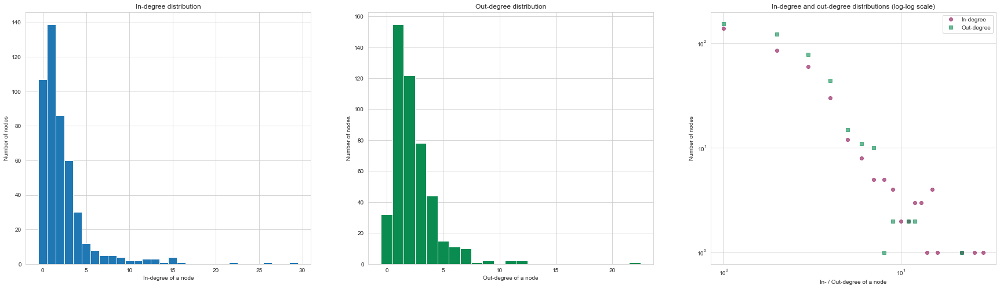

In [90]:
# identify the degrees, in-degrees, and out-degrees of all nodes.
degrees = [GCC.degree(n) for n in GCC.nodes()]
in_degrees = [GCC.in_degree(n) for n in GCC.nodes()]
out_degrees = [GCC.out_degree(n) for n in GCC.nodes()]
stats = [('Mean', np.mean(in_degrees), np.mean(out_degrees)),
         ('Mode', scipy.stats.mode(in_degrees)[0][0], scipy.stats.mode(out_degrees)[0][0]),
         ('Minimum', np.min(in_degrees), np.min(out_degrees)),
         ('Maximum', np.max(in_degrees), np.max(out_degrees))]

print(tabulate(stats, headers=['', 'IN-degree', 'OUT-degree'], tablefmt="fancy_grid"))
plot_distributions(in_degrees, out_degrees)

In [22]:
# Sorted list of tuples (character, degree) 
top_in = sorted(dict(GCC.in_degree()).items(), key= lambda x: x[1], reverse=True)
top_out = sorted(dict(GCC.out_degree()).items(), key= lambda x: x[1], reverse=True)

top_10 = [(x[0],x[1], ' ', y[0],y[1]) for x,y in zip(top_in[:10], top_out[:10])]

print(tabulate(top_10, headers=['Character','IN-degree','','Character','OUT-degree'], showindex=range(1,11), tablefmt="fancy_grid"))

╒════╤════════════════════════════╤═════════════╤════╤════════════════════════════╤══════════════╕
│    │ Character                  │   IN-degree │    │ Character                  │   OUT-degree │
╞════╪════════════════════════════╪═════════════╪════╪════════════════════════════╪══════════════╡
│  1 │ The Gray Fox (Oblivion)    │          29 │    │ Mannimarco (Oblivion)      │           22 │
├────┼────────────────────────────┼─────────────┼────┼────────────────────────────┼──────────────┤
│  2 │ Modryn Oreyn (Oblivion)    │          26 │    │ Lucien Lachance (Oblivion) │           12 │
├────┼────────────────────────────┼─────────────┼────┼────────────────────────────┼──────────────┤
│  3 │ Martin Septim (Oblivion)   │          22 │    │ Baurus                     │           12 │
├────┼────────────────────────────┼─────────────┼────┼────────────────────────────┼──────────────┤
│  4 │ Uriel Septim VII           │          16 │    │ Hieronymus Lex             │           11 │
├────┼────

## Identify the most statistically important nodes
#### Centrality measure

In [23]:
# Degree centrality
degree_centrality = nx.algorithms.centrality.degree_centrality(GCC)
degree_centrality_sorted = sorted(degree_centrality.items(), key=lambda item: item[1], reverse=True)
print(tabulate(degree_centrality_sorted[:10], headers=['Character', 'Degree centrality'], showindex=range(1,11), tablefmt="fancy_grid"))

╒════╤════════════════════════════╤═════════════════════╕
│    │ Character                  │   Degree centrality │
╞════╪════════════════════════════╪═════════════════════╡
│  1 │ Mannimarco (Oblivion)      │           0.07173   │
├────┼────────────────────────────┼─────────────────────┤
│  2 │ The Gray Fox (Oblivion)    │           0.0696203 │
├────┼────────────────────────────┼─────────────────────┤
│  3 │ Modryn Oreyn (Oblivion)    │           0.0654008 │
├────┼────────────────────────────┼─────────────────────┤
│  4 │ Martin Septim (Oblivion)   │           0.0590717 │
├────┼────────────────────────────┼─────────────────────┤
│  5 │ Lucien Lachance (Oblivion) │           0.0527426 │
├────┼────────────────────────────┼─────────────────────┤
│  6 │ Hannibal Traven (Oblivion) │           0.0506329 │
├────┼────────────────────────────┼─────────────────────┤
│  7 │ Janus Hassildor            │           0.0506329 │
├────┼────────────────────────────┼─────────────────────┤
│  8 │ Raminus

#### Betweenness centrality

In [24]:
# Betweenness centrality
betweenness_centrality = nx.betweenness_centrality(GCC, k=200) # k <= n. Higher values give better approximation.
betweenness_centrality_sorted = sorted(betweenness_centrality.items(), key=lambda item: item[1], reverse=True)
print(tabulate(betweenness_centrality_sorted[:10], headers=['Character', 'Betweenness centrality'], showindex=range(1,11), tablefmt="fancy_grid"))

╒════╤════════════════════════════╤══════════════════════════╕
│    │ Character                  │   Betweenness centrality │
╞════╪════════════════════════════╪══════════════════════════╡
│  1 │ Janus Hassildor            │                0.116934  │
├────┼────────────────────────────┼──────────────────────────┤
│  2 │ Amusei                     │                0.101585  │
├────┼────────────────────────────┼──────────────────────────┤
│  3 │ The Gray Fox (Oblivion)    │                0.0782315 │
├────┼────────────────────────────┼──────────────────────────┤
│  4 │ Pale Lady                  │                0.0676878 │
├────┼────────────────────────────┼──────────────────────────┤
│  5 │ Azzan                      │                0.0627203 │
├────┼────────────────────────────┼──────────────────────────┤
│  6 │ Irene Metrick              │                0.0581122 │
├────┼────────────────────────────┼──────────────────────────┤
│  7 │ Mannimarco (Oblivion)      │                0.05

## Exploration of attributes

In [91]:
import plotly.express as px


#### Races

In [92]:
race_distribution

Counter({'Altmer': 44,
         'Argonian': 33,
         'Bosmer': 32,
         'Breton': 50,
         'Dremora': 4,
         'Dunmer': 43,
         'Imperial': 114,
         'Khajiit': 28,
         'Nord': 45,
         'Orsimer': 27,
         'Redguard': 31})

In [109]:
fig = px.colors.qualitative.swatches()
fig.show()

In [111]:
from collections import Counter
from turtle import color

# count the number of characters in each race
race_dict = dict(GCC.nodes(data='race'))
race_distribution = Counter(race_dict.values())
race_distribution.pop('Unknown')

# save to a df for easier plotting
race_count_df = pd.DataFrame.from_records(list(dict(race_distribution).items()), columns=['race','count'])

## px plotting
# through pandas backend
# race_count_df.plot(kind='bar', x='race', y='count', title='Count of characters per race', color='race')
fig = px.bar(race_count_df, x='race', y='count', title='Count of characters per race', color='race', color_discrete_sequence=px.colors.qualitative.Bold)
fig.show()

## matplotlib plotting
# fig, ax = plt.subplots(figsize=(15,5))
# ax.bar(x=list(race_distribution.keys()), height=list(race_distribution.values()),  width=1, color='thistle')
# ax.set(xlabel='Race',
#        ylabel='Number of characters',
#        title='Race distribution')
# plt.show()

#### Factions

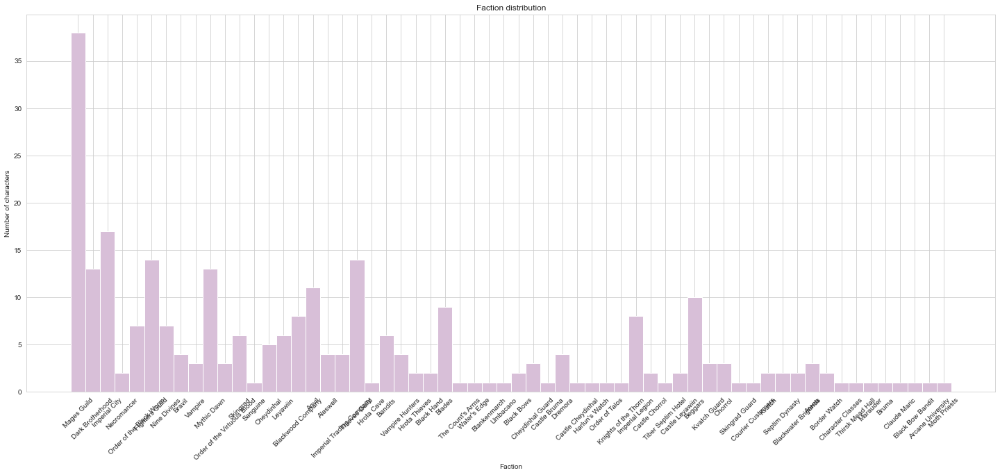

In [26]:
faction_dict = dict(GCC.nodes(data='faction'))
faction_distribution = Counter(faction_dict.values())

faction_distribution.pop('None')

fig, ax = plt.subplots(figsize=(25,10))
ax.bar(x=list(faction_distribution.keys()), height=list(faction_distribution.values()),  width=1, color='thistle')
ax.xaxis.set_tick_params(rotation=45)
ax.set(xlabel='Faction',
       ylabel='Number of characters',
       title='Faction distribution')
plt.show()

#### Gender

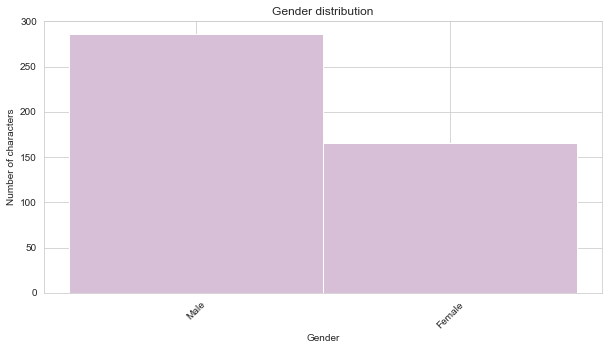

In [27]:
gender_dict = dict(GCC.nodes(data='gender'))
gender_distribution = Counter(gender_dict.values())

gender_distribution.pop('Unknown')

fig, ax = plt.subplots(figsize=(10,5))
ax.bar(x=list(gender_distribution.keys()), height=list(gender_distribution.values()),  width=1, color='thistle')
ax.xaxis.set_tick_params(rotation=45)
ax.set(xlabel='Gender',
       ylabel='Number of characters',
       title='Gender distribution')
plt.show()

#### Essential

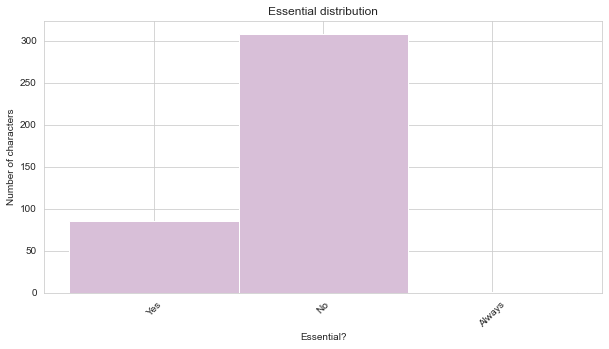

In [28]:
essential_dict = dict(GCC.nodes(data='essential'))
essential_distribution = Counter(essential_dict.values())

essential_distribution.pop('Unknown')

fig, ax = plt.subplots(figsize=(10,5))
ax.bar(x=list(essential_distribution.keys()), height=list(essential_distribution.values()),  width=1, color='thistle')
ax.xaxis.set_tick_params(rotation=45)
ax.set(xlabel='Essential?',
       ylabel='Number of characters',
       title='Essential distribution')
plt.show()

### Community detection - are there sub-communities in Oblivion including characters that consist of different guilds or races?
#### random_state=60

In [29]:
# !pip uninstall community
# !pip install python-louvain


In [30]:
import community as community_louvain 

partition = community_louvain.best_partition(UGCC, random_state=60)

# identify the communities
community_characters = {}
for k, v in partition.items():
    if v not in community_characters.keys():
        community_characters[v] = [k]
    else:
        community_characters[v] += [k]

In [31]:
n_commu = len(community_characters)
print('The amount of communities based on the Louvain algorithm is:', n_commu)

The amount of communities based on the Louvain algorithm is: 17


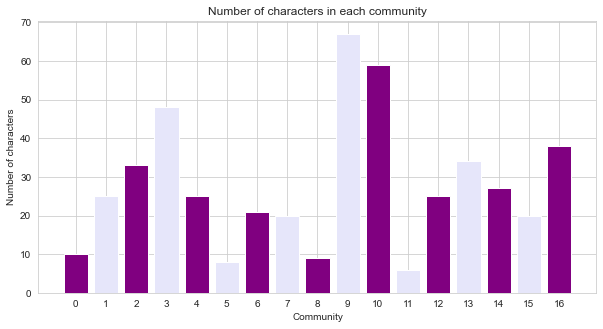

In [32]:
community_size = {k:len(v) for k,v in community_characters.items()}
community_size = dict(sorted(community_size.items(), key=lambda kv: kv[0]))

fig, ax = plt.subplots(figsize=(10,5))
ax.bar(x=list(community_size.keys()),
       height=list(community_size.values()),
       color=['purple', 'lavender'])
ax.set(xlabel='Community',
       ylabel='Number of characters',
       title='Number of characters in each community',
       xticks=list(community_size.keys()))
plt.show()

In [33]:
# Name each community by its three most connected artists, and get their degree distribution
communities_name = {}
communities_degrees = {}
for c, list_characters in community_characters.items():
    artists_deg = {}
    commu_in_degrees, commu_out_degrees = [], []
    for n in list_characters:
        artists_deg[n] = GCC.degree(n)
        commu_in_degrees += [GCC.in_degree(n)]
        commu_out_degrees += [GCC.out_degree(n)]
    # We made sure to check that all communities had at least 3 nodes
    top3 = sorted(artists_deg.items(), key= lambda x: x[1], reverse=True)[:3]
    name = top3[0][0] + '-' + top3[1][0] + '-' + top3[2][0]
    communities_name[c] = name
    communities_degrees[c] = {'in':commu_in_degrees, 'out':commu_out_degrees}

In [34]:
table = []
for i in range(n_commu):
    table += [(i, communities_name[i], community_size[i],
               round(np.mean(communities_degrees[i]['in']),3),
               round(np.mean(communities_degrees[i]['out']),3))]
    
print(tabulate(table, headers=['Community', 'Name', 'Size', 'Avg IN', 'Avg OUT'], tablefmt="fancy_grid"))

╒═════════════╤══════════════════════════════════════════════════════════════════╤════════╤══════════╤═══════════╕
│   Community │ Name                                                             │   Size │   Avg IN │   Avg OUT │
╞═════════════╪══════════════════════════════════════════════════════════════════╪════════╪══════════╪═══════════╡
│           0 │ Aleswell (Oblivion)-Ancotar-Diram Serethi                        │     10 │    2.9   │     2.7   │
├─────────────┼──────────────────────────────────────────────────────────────────┼────────┼──────────┼───────────┤
│           1 │ Dagail-Agronak gro-Malog-Ardaline                                │     25 │    2     │     2.08  │
├─────────────┼──────────────────────────────────────────────────────────────────┼────────┼──────────┼───────────┤
│           2 │ Lucien Lachance (Oblivion)-Mathieu Bellamont-Ocheeva             │     33 │    2.515 │     2.606 │
├─────────────┼─────────────────────────────────────────────────────────────────

## Network visualizations

In [35]:
from fa2 import ForceAtlas2
forceatlas2 = ForceAtlas2(# Behavior alternatives
                          outboundAttractionDistribution=False,  # Dissuade hubs
                          edgeWeightInfluence=5.0,
                          # Performance
                          jitterTolerance=1.0,  # Tolerance
                          barnesHutOptimize=True,
                          barnesHutTheta=1.2,
                          # Tuning
                          scalingRatio=2.0,
                          strongGravityMode=False,
                          gravity=50.0,
                          verbose=True)

In [36]:
# !pip install --upgrade scipy networkx
# !pip install scipy==1.8.1

In [37]:
# GCC positions
positions = forceatlas2.forceatlas2_networkx_layout(UGCC, pos=None, iterations=2000)

# G positions
Gpositions = forceatlas2.forceatlas2_networkx_layout(G, pos=None, iterations=2000)

100%|██████████| 2000/2000 [00:04<00:00, 421.75it/s]


BarnesHut Approximation  took  1.35  seconds
Repulsion forces  took  2.88  seconds
Gravitational forces  took  0.04  seconds
Attraction forces  took  0.06  seconds
AdjustSpeedAndApplyForces step  took  0.22  seconds


100%|██████████| 2000/2000 [00:10<00:00, 189.41it/s]

BarnesHut Approximation  took  2.99  seconds
Repulsion forces  took  6.68  seconds
Gravitational forces  took  0.07  seconds
Attraction forces  took  0.05  seconds
AdjustSpeedAndApplyForces step  took  0.40  seconds


# G Visualized

In [38]:
degrees = dict(G.degree)
node_size = [(v+1) * 50 for v in degrees.values()]
labels = {n: n if G.degree(n) > 15 else '' for n in G.nodes}

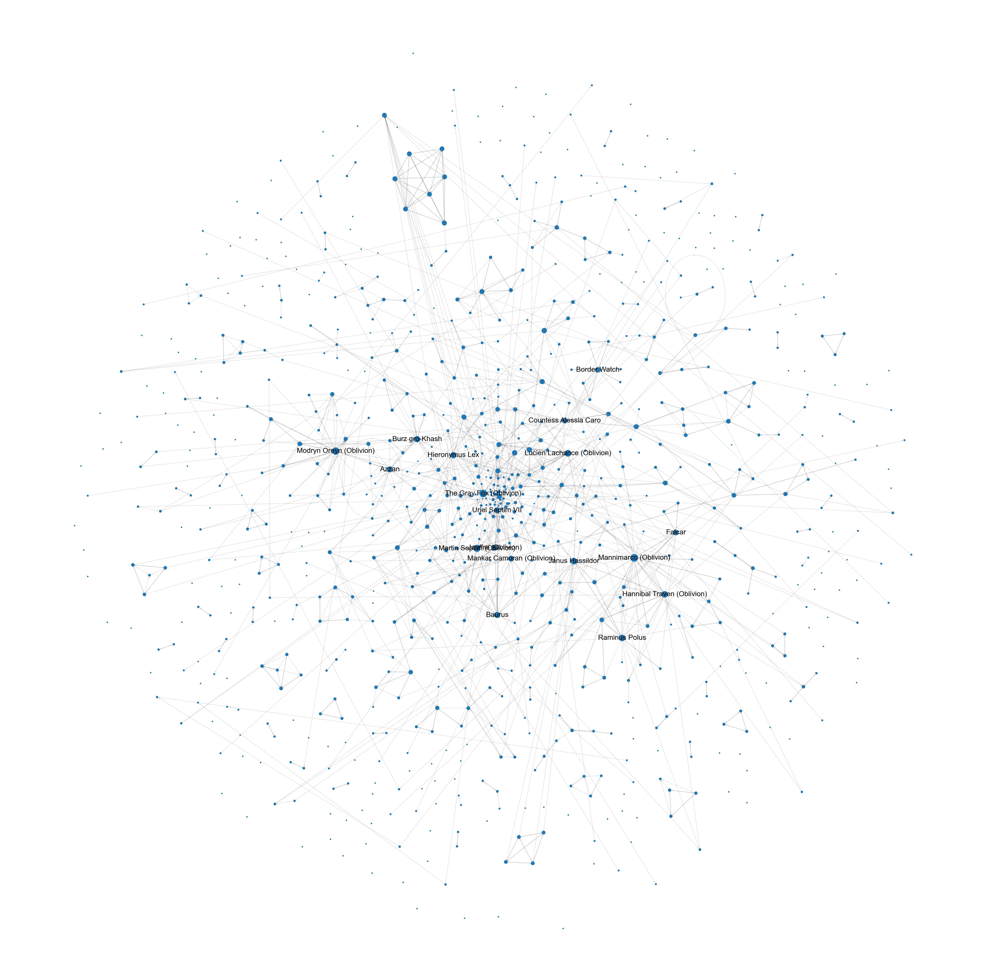

In [39]:
fig, ax = plt.subplots(figsize=(100, 100))
nx.draw_networkx_nodes(G, Gpositions, node_size=node_size)
nx.draw_networkx_edges(G, Gpositions, width=3, alpha=0.1)
nx.draw_networkx_labels(G, Gpositions, labels=labels, font_size=40)
plt.axis('off')
plt.show()

## GCC visualized

In [40]:
degrees = dict(UGCC.degree)
node_size = [(v+1) * 50 for v in degrees.values()]
labels = {n: n if UGCC.degree(n) > 150 else '' for n in UGCC.nodes}

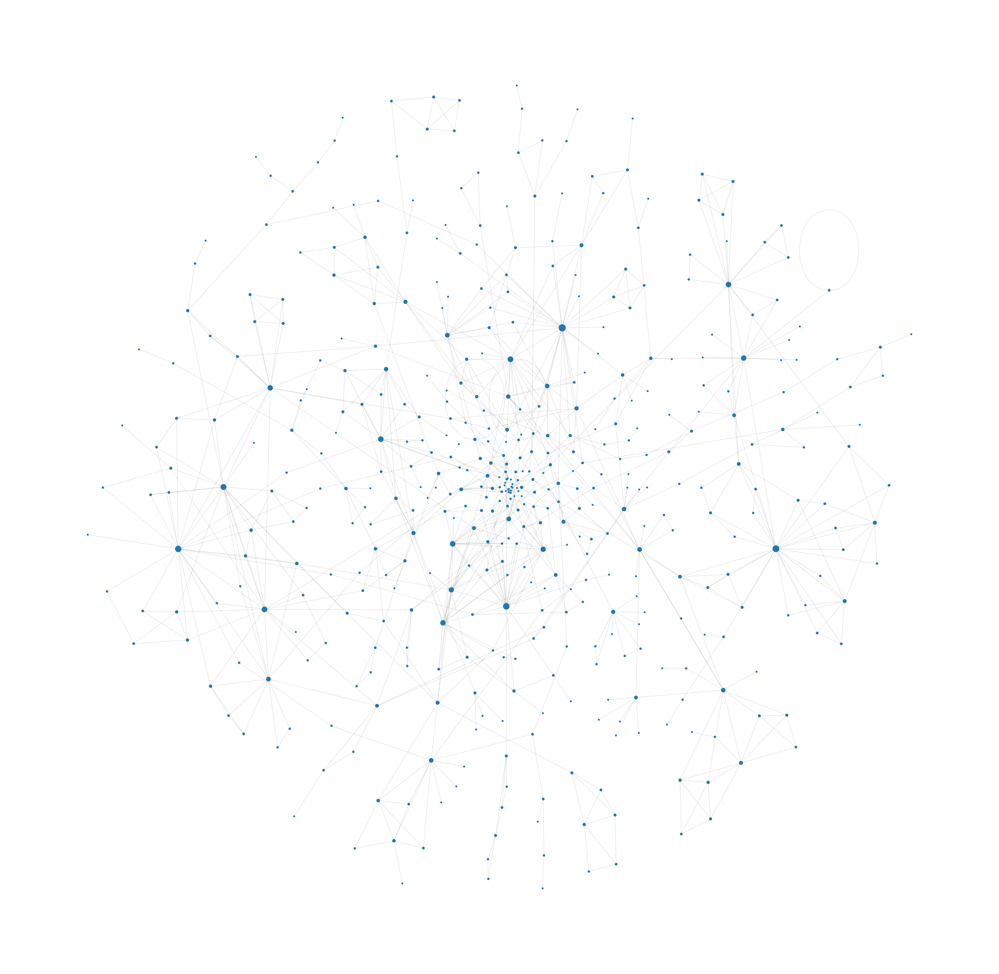

In [41]:
fig, ax = plt.subplots(figsize=(100, 100))
nx.draw_networkx_nodes(UGCC, positions, node_size=node_size)
nx.draw_networkx_edges(UGCC, positions, width=3, alpha=0.1)
nx.draw_networkx_labels(UGCC, positions, labels=labels, font_size=40, font_color='white')
plt.axis('off')
plt.show()

### races - different color for each

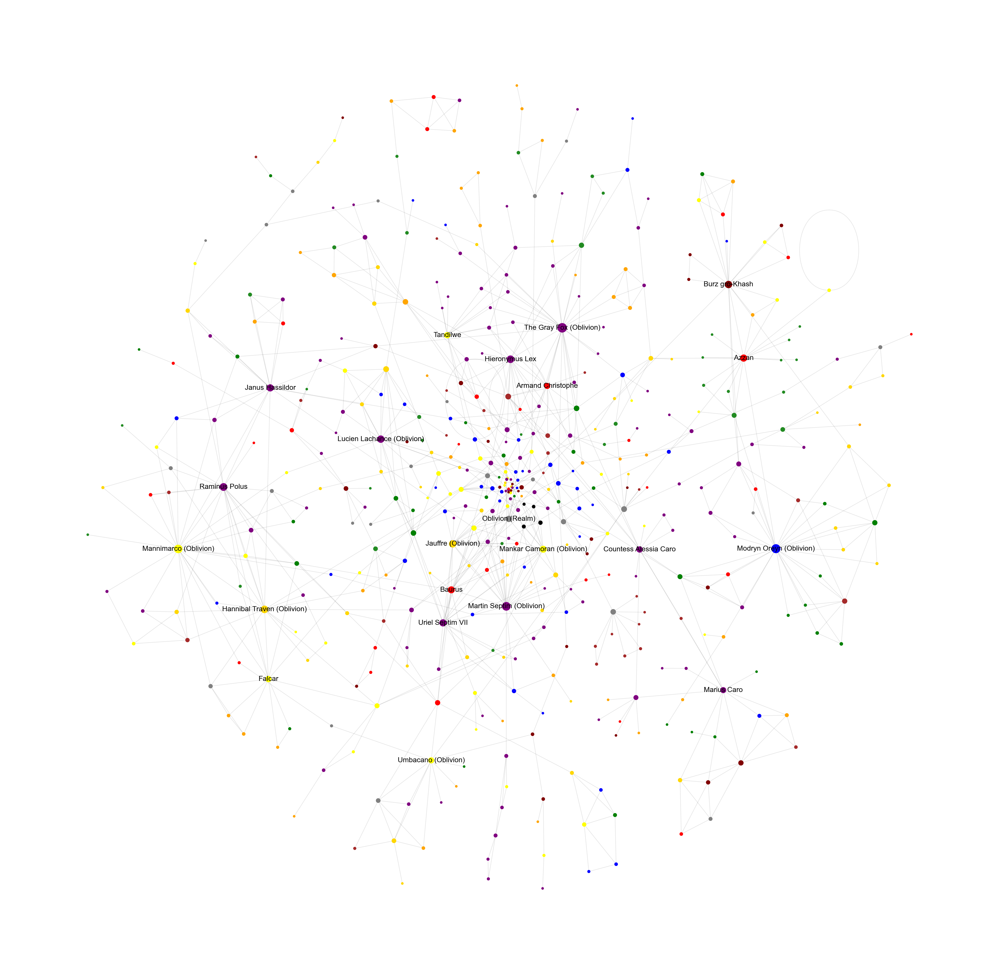

In [42]:
degrees = dict(UGCC.degree)
node_size = [(v+1) * 90 for v in degrees.values()]

# We use a colormap to define colors for the races. 
node_colors = ['yellow' if 'Altmer' in UGCC.nodes[node]['race'] 
               else 'grey' if 'Unknown' in UGCC.nodes[node]['race'] 
               else 'green' if 'Argonian' in UGCC.nodes[node]['race']
               else 'forestgreen' if 'Bosmer' in UGCC.nodes[node]['race'] 
               else 'gold' if 'Breton' in UGCC.nodes[node]['race'] 
               else 'black' if 'Dremora' in UGCC.nodes[node]['race']
               else 'blue' if 'Dunmer' in UGCC.nodes[node]['race'] 
               else 'purple' if 'Imperial' in UGCC.nodes[node]['race']
               else 'brown' if 'Khajiit' in UGCC.nodes[node]['race'] 
               else 'orange' if 'Nord' in UGCC.nodes[node]['race'] 
               else 'maroon' if 'Orsimer' in UGCC.nodes[node]['race']
               else 'Red'for node in UGCC.nodes()]

# everynames = ''.join(list(race_characters.keys()))
labels = {n: n if UGCC.degree(n) > 10 else '' for n in UGCC.nodes}

# plotting
import matplotlib.cm as cm
from matplotlib.colors import LinearSegmentedColormap

fig, ax = plt.subplots(figsize=(100, 100))
# color the nodes according to their partition
cmap = cm.get_cmap('gist_ncar', max(partition.values()) + 1)
nx.draw_networkx_nodes(UGCC, positions, node_size=node_size, cmap=cmap, node_color=node_colors)
nx.draw_networkx_edges(UGCC, positions, width=3, alpha=0.1)
nx.draw_networkx_labels(UGCC, positions, labels=labels, font_size=40, font_color='black')
plt.axis('off')
plt.show()

### factions - different color for each

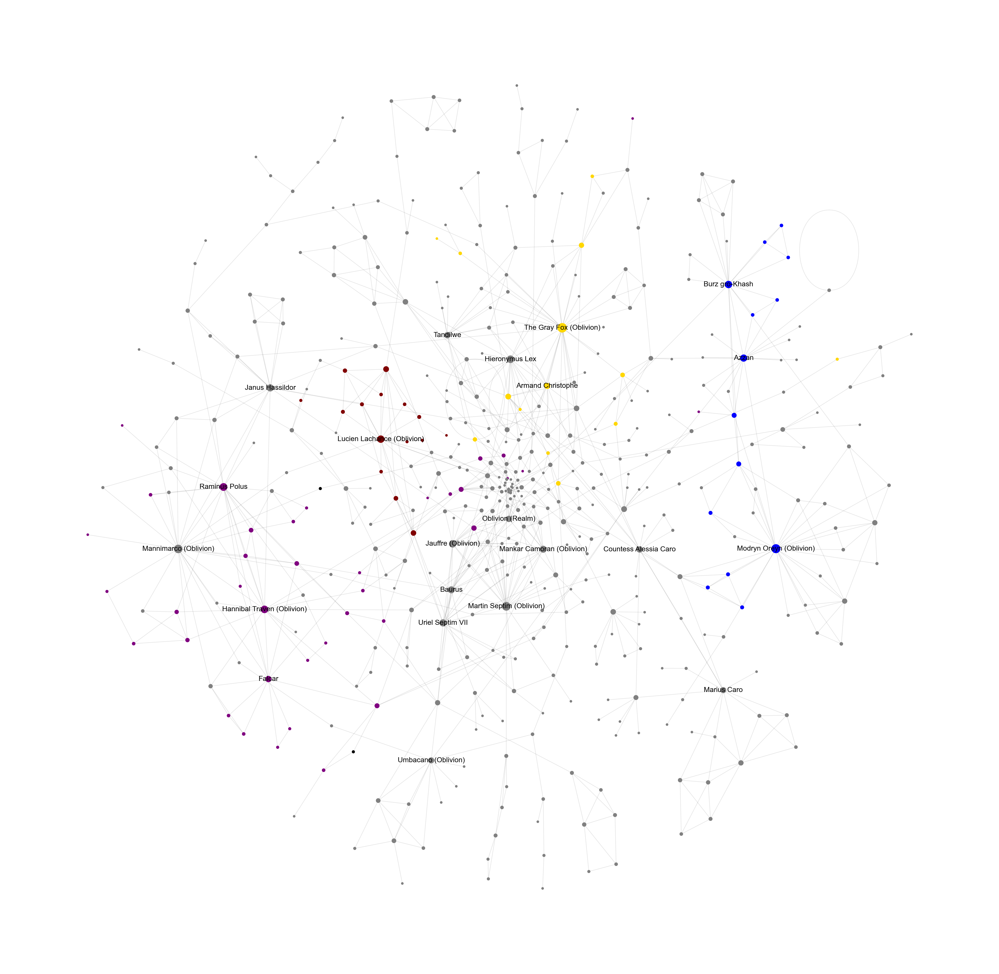

In [43]:
# We use a colormap to define colors for the races. 
node_colors = ['maroon' if 'Dark Brotherhood' in UGCC.nodes[node]['faction'] 
               else 'black' if 'Necromancer' in UGCC.nodes[node]['faction'] 
               else 'blue' if 'Fighters Guild' in UGCC.nodes[node]['faction']
               else 'purple' if 'Mages Guild' in UGCC.nodes[node]['faction'] 
               else 'gold' if 'Thieves Guild' in UGCC.nodes[node]['faction'] 
               else 'maroon' if 'Black Hand' in UGCC.nodes[node]['faction']
               else 'grey' for node in UGCC.nodes()]

# everynames = ''.join(list(race_characters.keys()))
labels = {n: n if UGCC.degree(n) > 10 else '' for n in UGCC.nodes}

# plotting
import matplotlib.cm as cm
from matplotlib.colors import LinearSegmentedColormap

fig, ax = plt.subplots(figsize=(100, 100))
# color the nodes according to their partition
cmap = cm.get_cmap('gist_ncar', max(partition.values()) + 1)
nx.draw_networkx_nodes(UGCC, positions, node_size=node_size, cmap=cmap, node_color=node_colors)
nx.draw_networkx_edges(UGCC, positions, width=3, alpha=0.1)
nx.draw_networkx_labels(UGCC, positions, labels=labels, font_size=40, font_color='black')
plt.axis('off')
plt.show()

### communities - different color for each

In [44]:
# We use a colormap to define colors for the communities. 
# We switch them around so that the big communities, that have numbers close to each other 0,1,2,3, don’t have also
# colors close to each other in the spectrum.
color_shuffling = {0:2, 1:5, 2:15, 3:3, 4:10, 5:9, 6:4, 7:7, 8:1, 9:11, 10:13, 11:12, 12:6, 13:13, 14:8, 15:14, 16:16, 17:17, 18:0}
node_color = [color_shuffling[p] for p in list(partition.values())]
everynames = ''.join(list(communities_name.values()))
labels = {n: n if n in everynames else '' for n in UGCC.nodes}

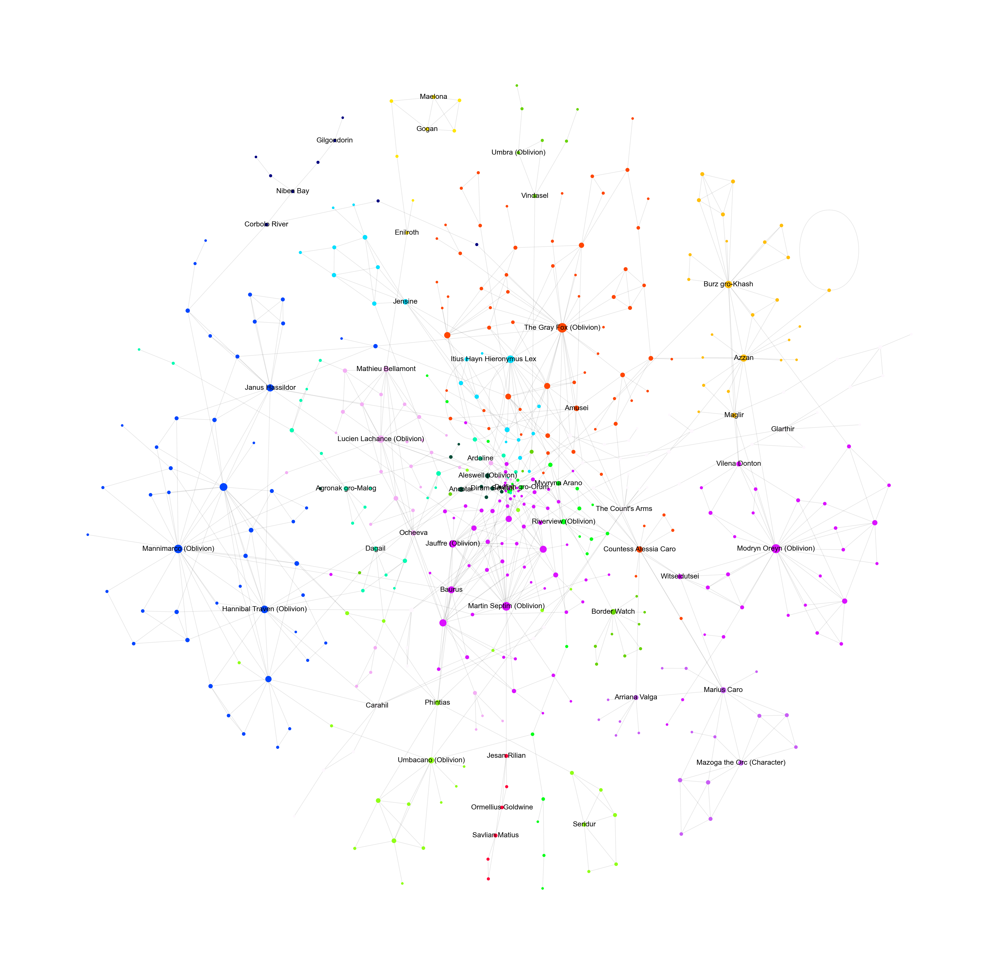

In [45]:
import matplotlib.cm as cm
from matplotlib.colors import LinearSegmentedColormap

fig, ax = plt.subplots(figsize=(100, 100))
# color the nodes according to their partition
cmap = cm.get_cmap('gist_ncar', max(partition.values()) + 1)
nx.draw_networkx_nodes(UGCC, positions, node_size=node_size, cmap=cmap, node_color=node_color)
nx.draw_networkx_edges(UGCC, positions, width=3, alpha=0.1)
nx.draw_networkx_labels(UGCC, positions, labels=labels, font_size=40, font_color='black')
plt.axis('off')
plt.show()

### plot each community

16


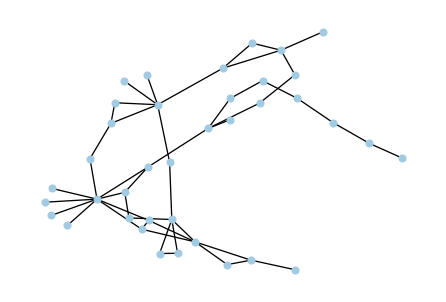

15


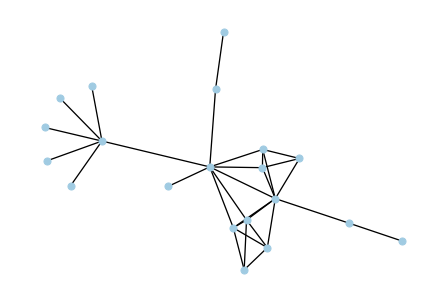

14


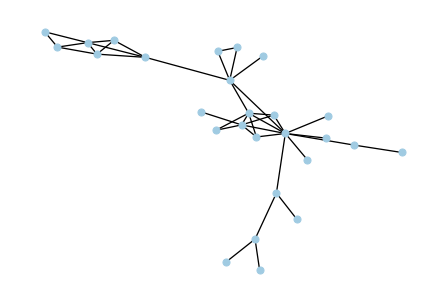

13


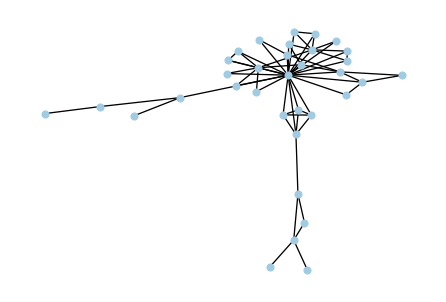

12


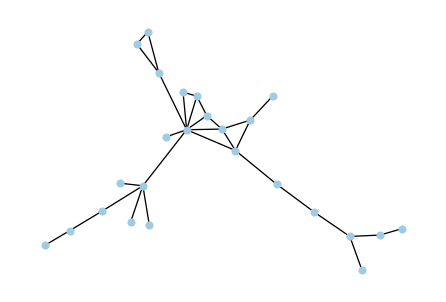

11


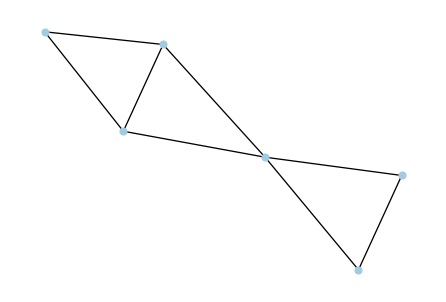

10


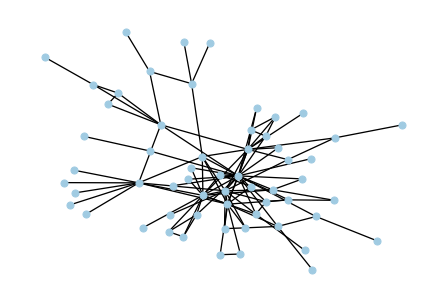

9


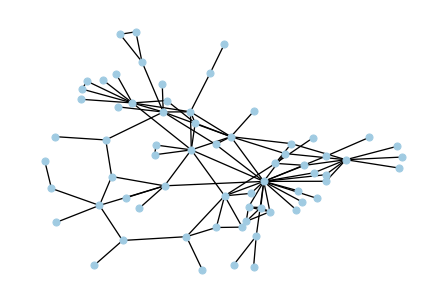

8


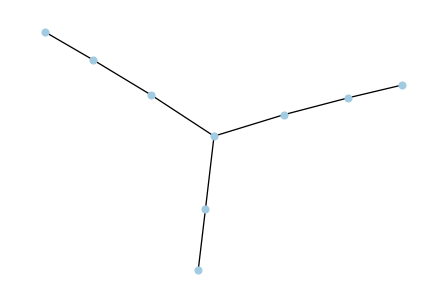

7


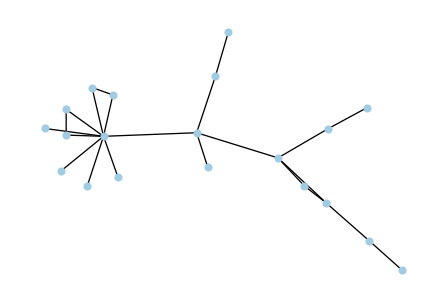

6


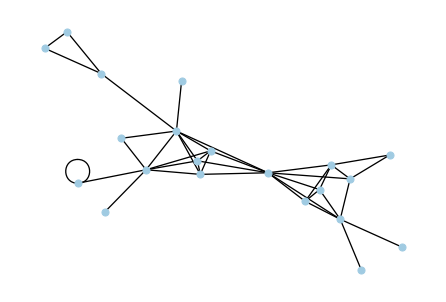

5


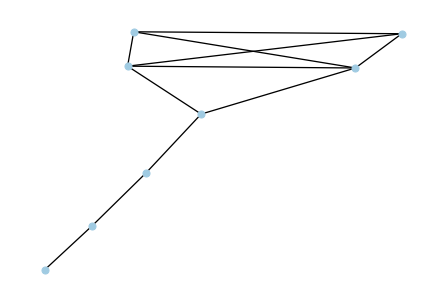

4


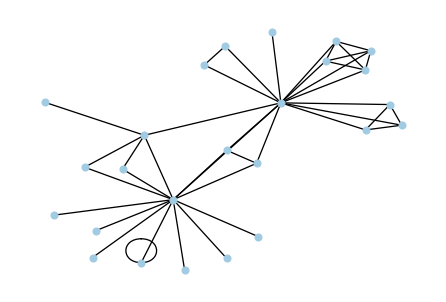

3


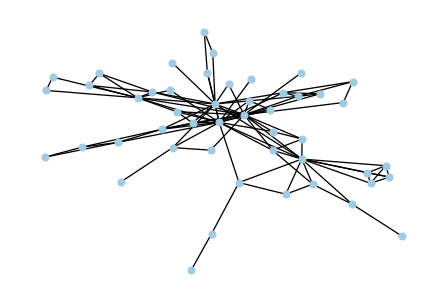

2


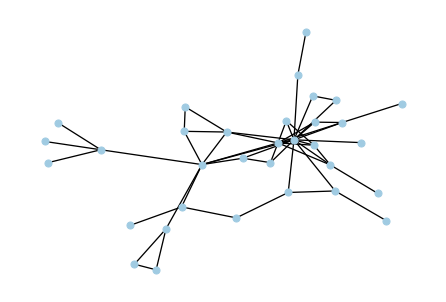

1


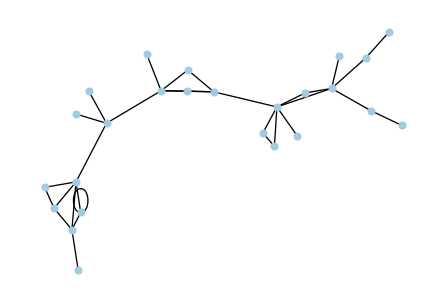

0


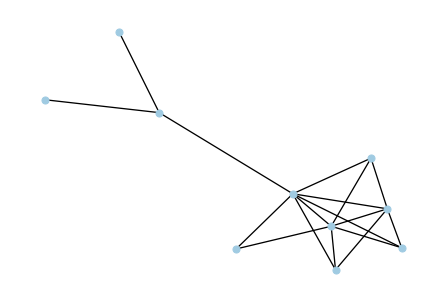

In [46]:
for i in range(17):
   print(16-i)
   nx.draw(UGCC.subgraph(community_characters[16-i]), node_size=50, node_color='#A0CBE2', width=1.3)
   plt.show()

# Bokeh for interactive network plots

In [77]:
from bokeh.io import output_notebook, show, save
from bokeh.models import Range1d, Circle, ColumnDataSource, MultiLine
from bokeh.plotting import figure
from bokeh.plotting import from_networkx
from bokeh.palettes import Blues8, Reds8, Purples8, Oranges8, Viridis8, Spectral8
from bokeh.transform import linear_cmap
output_notebook()

Loading BokehJS ...

### Full network

In [78]:
# show the entire network
degrees = dict(nx.degree(G))
nx.set_node_attributes(G, name='degree', values=degrees)

number_to_adjust_by = 1
adjusted_node_size = dict([(node, degree+number_to_adjust_by) for node, degree in nx.degree(G)])
nx.set_node_attributes(G, name='adjusted_node_size', values=adjusted_node_size)

# positions_commu = {n:pos for n,pos in positions.items() if n in community_characters[2]}

In [79]:
#Choose attributes from G network to size and color by — setting manual size (e.g. 10) or color (e.g. 'skyblue') also allowed
size_by_this_attribute = 'adjusted_node_size'
color_by_this_attribute = 'adjusted_node_size'

#Pick a color palette — Blues8, Reds8, Purples8, Oranges8, Viridis8
color_palette = Purples8

#Choose a title!
title = 'Full Oblivion Network'

#Establish which categories will appear when hovering over each node
HOVER_TOOLTIPS = [
        ("Artist", "@index"),
        ("Degree", "@degree"),
        ("Race", "@race"),
        ("Faction", "@faction"),
        ("Essential", "@essential")
]

#Create a plot — set dimensions, toolbar, and title
plot = figure(tooltips = HOVER_TOOLTIPS,
              tools="pan,wheel_zoom,save,reset", active_scroll='wheel_zoom',
              x_range=Range1d(-100.1, 100.1), y_range=Range1d(-100.1, 100.1), title=title)

#Create a network graph object
# https://networkx.github.io/documentation/networkx-1.9/reference/generated/networkx.drawing.layout.spring_layout.html\
network_graph = from_networkx(G, nx.spring_layout, scale=100, center=(0, 0), pos=positions) # pos from ForceAtlas2

#Set node sizes and colors according to node degree (color as spectrum of color palette)
minimum_value_color = min(network_graph.node_renderer.data_source.data[color_by_this_attribute])
maximum_value_color = max(network_graph.node_renderer.data_source.data[color_by_this_attribute])
network_graph.node_renderer.glyph = Circle(size=size_by_this_attribute, fill_color=linear_cmap(color_by_this_attribute, color_palette, minimum_value_color, maximum_value_color))

#Set edge opacity and width
network_graph.edge_renderer.glyph = MultiLine(line_alpha=0.1, line_width=0.05)

plot.renderers.append(network_graph)

show(plot)
# save(plot, filename=f"{title}.html")

## GCC

In [80]:
# show the entire network
degrees = dict(nx.degree(GCC))
nx.set_node_attributes(GCC, name='degree', values=degrees)

number_to_adjust_by = 1
adjusted_node_size = dict([(node, degree+number_to_adjust_by) for node, degree in nx.degree(G)])
nx.set_node_attributes(GCC, name='adjusted_node_size', values=adjusted_node_size)

# positions_commu = {n:pos for n,pos in positions.items() if n in community_characters[2]}

In [81]:
#Choose attributes from G network to size and color by — setting manual size (e.g. 10) or color (e.g. 'skyblue') also allowed
size_by_this_attribute = 'adjusted_node_size'
color_by_this_attribute = 'adjusted_node_size'

#Pick a color palette — Blues8, Reds8, Purples8, Oranges8, Viridis8
color_palette = Reds8

#Choose a title!
title = 'GCC Oblivion Network'

#Establish which categories will appear when hovering over each node
HOVER_TOOLTIPS = [
        ("Artist", "@index"),
        ("Degree", "@degree"),
        ("Race", "@race"),
        ("Faction", "@faction"),
        ("Essential", "@essential")
]

#Create a plot — set dimensions, toolbar, and title
plot = figure(tooltips = HOVER_TOOLTIPS,
              tools="pan,wheel_zoom,save,reset", active_scroll='wheel_zoom',
              x_range=Range1d(-100.1, 100.1), y_range=Range1d(-100.1, 100.1), title=title)

#Create a network graph object
# https://networkx.github.io/documentation/networkx-1.9/reference/generated/networkx.drawing.layout.spring_layout.html\
network_graph = from_networkx(GCC, nx.spring_layout, scale=100, center=(0, 0), pos=positions) # pos from ForceAtlas2

#Set node sizes and colors according to node degree (color as spectrum of color palette)
minimum_value_color = min(network_graph.node_renderer.data_source.data[color_by_this_attribute])
maximum_value_color = max(network_graph.node_renderer.data_source.data[color_by_this_attribute])
network_graph.node_renderer.glyph = Circle(size=size_by_this_attribute, fill_color=linear_cmap(color_by_this_attribute, color_palette, minimum_value_color, maximum_value_color))

#Set edge opacity and width
network_graph.edge_renderer.glyph = MultiLine(line_alpha=0.1, line_width=0.05)

plot.renderers.append(network_graph)

show(plot)
# save(plot, filename=f"{title}.html")

### Community 2: dark brotherhood

In [82]:
# show the dark brotherhood network
subG = UGCC.subgraph(community_characters[2])
degrees = dict(nx.degree(subG))
nx.set_node_attributes(subG, name='degree', values=degrees)

number_to_adjust_by = 1
adjusted_node_size = dict([(node, degree+number_to_adjust_by) for node, degree in nx.degree(subG)])
nx.set_node_attributes(subG, name='adjusted_node_size', values=adjusted_node_size)

positions_commu = {n:pos for n,pos in positions.items() if n in community_characters[2]}

In [83]:
#Choose attributes from G network to size and color by — setting manual size (e.g. 10) or color (e.g. 'skyblue') also allowed
size_by_this_attribute = 'adjusted_node_size'
color_by_this_attribute = 'adjusted_node_size'

#Pick a color palette — Blues8, Reds8, Purples8, Oranges8, Viridis8
color_palette = Oranges8

#Choose a title!
title = 'Community 2'

#Establish which categories will appear when hovering over each node
HOVER_TOOLTIPS = [
        ("Artist", "@index"),
        ("Degree", "@degree"),
        ("Race", "@race"),
        ("Faction", "@faction"),
        ("Essential", "@essential")
]

#Create a plot — set dimensions, toolbar, and title
plot = figure(tooltips = HOVER_TOOLTIPS,
              tools="pan,wheel_zoom,save,reset", active_scroll='wheel_zoom',
              x_range=Range1d(-100.1, 100.1), y_range=Range1d(-100.1, 100.1), title=title)

#Create a network graph object
# https://networkx.github.io/documentation/networkx-1.9/reference/generated/networkx.drawing.layout.spring_layout.html\
network_graph = from_networkx(subG, nx.spring_layout, scale=100, center=(0, 0), pos=positions_commu) # pos from ForceAtlas2

#Set node sizes and colors according to node degree (color as spectrum of color palette)
minimum_value_color = min(network_graph.node_renderer.data_source.data[color_by_this_attribute])
maximum_value_color = max(network_graph.node_renderer.data_source.data[color_by_this_attribute])
network_graph.node_renderer.glyph = Circle(size=size_by_this_attribute, fill_color=linear_cmap(color_by_this_attribute, color_palette, minimum_value_color, maximum_value_color))

#Set edge opacity and width
network_graph.edge_renderer.glyph = MultiLine(line_alpha=0.1, line_width=0.05)

plot.renderers.append(network_graph)

show(plot)
# save(plot, filename=f"{title}.html")

Show more communities if wanted!

#### Modularity of partitions compared to modularity of breakdown by attributes

In [54]:
def compute_modularity(community_nodes, G):
    M = 0
    L = G.number_of_edges()
    for community, nodes in community_nodes.items():
        com = G.subgraph(nodes)
        Lc = com.number_of_edges()
        kc = sum(d for n,d in com.degree)
        M += (Lc/L) - (kc/(2*L))**2

    return M

In [55]:
# Modularity with louvain communities:
compute_modularity(community_characters, GCC)

0.8482283585120337

In [56]:
# need to make a dict of every faction / race, that contains all the characters

In [57]:
# # Modularity with the faction
# # Hypothesis: characters of the same faction interact more
# hard to test because None has a bunch!
faction_characters = {}
for character, faction in faction_dict.items():
    if faction in faction_characters.keys():
        faction_characters[faction] += [character]
    else:
        faction_characters[faction] = [character]

compute_modularity(faction_characters, GCC)

0.37474496291688314

In [58]:
# # Modularity with the race
# # Hypothesis: characters of the same race interact more
race_characters = {}
for character, race in race_dict.items():
    if race in race_characters.keys():
        race_characters[race] += [character]
    else:
        race_characters[race] = [character]

compute_modularity(race_characters, GCC)

0.22548984847654627

### Confusion matrix - community/attributes
#### Do the communities line up with different attributes?

In [59]:
def show_confusion_matrix(attr_nodes_dict, commu_nodes_dict, figsize):
    list_attr = list(attr_nodes_dict.keys())
    list_commu = sorted(list(commu_nodes_dict.keys()))
    R = len(list_attr)
    C = len(list_commu)
    D = np.zeros((R,C), dtype=int)
    for i in range(D.shape[0]):
        for j in range(D.shape[1]):
            nodes_attr = attr_nodes_dict[list_attr[i]]
            nodes_commu = commu_nodes_dict[list_commu[j]]
            # Number of common nodes:
            D[i][j] = len(list(set(nodes_attr) & set(nodes_commu)))

    fig, ax = plt.subplots(figsize=figsize)
    im = ax.imshow(np.log(D), cmap='viridis')
    # We want to show all ticks...
    ax.set_xticks(np.arange(C))
    ax.set_yticks(np.arange(R))
    # ... and label them with the respective list entries
    ax.set_xticklabels(list_commu)
    ax.set_yticklabels(list_attr)
    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")
    # Loop over data dimensions and create text annotations.
    for i in range(R):
        for j in range(C):
            text = ax.text(j, i, D[i, j],
                           ha="center", va="center", color="w")
    plt.grid(False)
    fig.tight_layout()
    plt.show()

/var/folders/z5/w7rdzhpn7xx4g1wy_6cb0stw0000gn/T/ipykernel_15564/290096267.py:15: RuntimeWarning: divide by zero encountered in log
  im = ax.imshow(np.log(D), cmap='viridis')


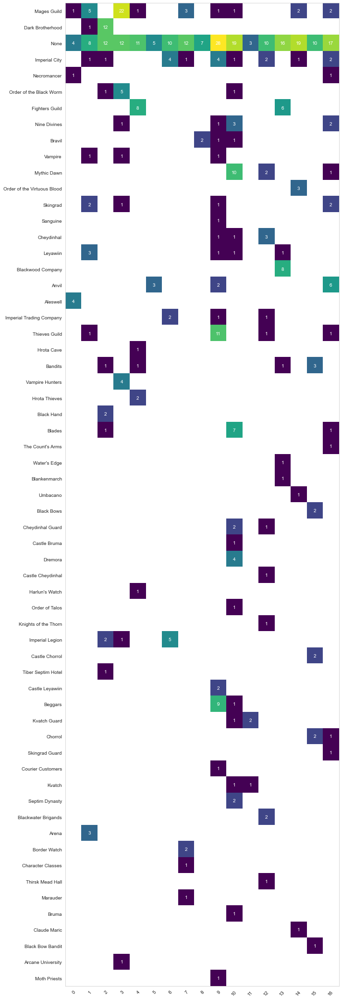

In [60]:
show_confusion_matrix(faction_characters, community_characters, figsize=(10,50))

### investigate the above results
1. Mages Guild is community 3?
2. Dark Brotherhood is community 2?
3. Beggars and Thieves Guild could be community 9?

In [61]:
# reverse the comm dict
character_comm = {}
for comm, characters in community_characters.items():
    for character in characters:
        if character in character_comm.keys():
            character_comm[character] += comm
        else:
            character_comm[character] = comm
            
# add the community to the dataframe of the gcc
gcc_df['community'] = gcc_df.index.map(character_comm)            

#### Does community 3 mostly contain Mage's Guild members?

In [62]:
gcc_df.loc[gcc_df.community==3]

,race,gender,faction,essential,community
Arterion,Altmer,Male,None,No,3
Caranya,Altmer,Female,Mages Guild,Yes,3
Errandil,Altmer,Male,Nine Divines,No,3
Falcar,Altmer,Male,Mages Guild,Yes,3
Hindaril,Altmer,Male,Vampire,No,3
Redwater Slough,Unknown,Unknown,None,Unknown,3
Mannimarco (Oblivion),Altmer,Male,Order of the Black Worm,No,3
Volanaro (Oblivion),Altmer,Male,Mages Guild,No,3
Deetsan,Argonian,Female,Mages Guild,Yes,3
Hal-Liurz,Argonian,Female,Skingrad,Yes,3


#### Does community 2 mostly contain Dark Brotherhood members?

In [63]:
gcc_df.loc[gcc_df.community==2]

,race,gender,faction,essential,community
Arquen,Altmer,Female,Dark Brotherhood,Yes,2
Atraena,Altmer,Female,Imperial City,No,2
Celedaen,Altmer,Male,Order of the Black Worm,No,2
Faelian,Altmer,Male,None,No,2
Hides-His-Heart,Argonian,Male,None,No,2
Ocheeva,Argonian,Female,Dark Brotherhood,Yes,2
Scar-Tail,Argonian,Male,None,No,2
Bogwater,Unknown,Unknown,None,Unknown,2
Teinaava,Argonian,Male,Dark Brotherhood,Yes,2
Telaendril,Bosmer,Female,Dark Brotherhood,No,2


#### Does community 9 contain Beggers and Thieves Guild members mostly?

In [64]:
gcc_df.loc[gcc_df.community==9]

,race,gender,faction,essential,community
Calindil,Altmer,Male,None,No,9
Hlidara Mothril,Altmer,Female,None,No,9
Tandilwe,Altmer,Female,Nine Divines,Unknown,9
Termanwe (Oblivion),Altmer,Female,Sanguine,Yes,9
Amusei,Argonian,Male,Imperial City,Yes,9
...,...,...,...,...,...
Olfand,Nord,Male,None,No,9
Skjorta,Nord,Female,None,No,9
Armand Christophe,Redguard,Male,Thieves Guild,Yes,9
Orrin,Redguard,Male,Thieves Guild,No,9


/var/folders/z5/w7rdzhpn7xx4g1wy_6cb0stw0000gn/T/ipykernel_15564/290096267.py:15: RuntimeWarning: divide by zero encountered in log
  im = ax.imshow(np.log(D), cmap='viridis')


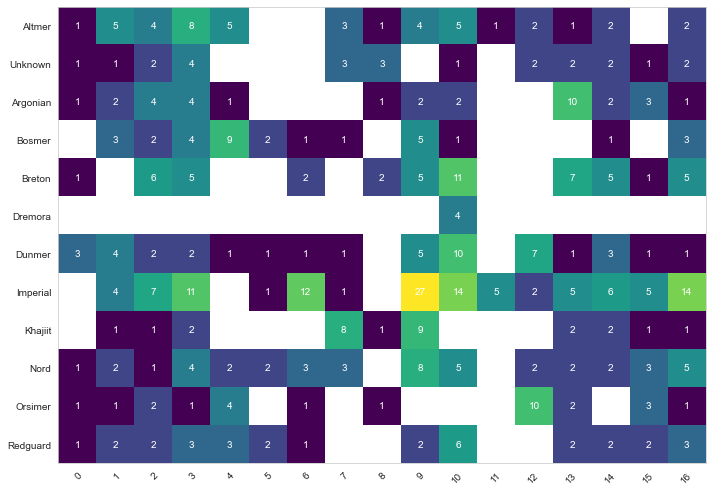

In [65]:
show_confusion_matrix(race_characters, community_characters, figsize=(10,50))

### investigate the above results

In [66]:
gcc_df

,race,gender,faction,essential,community
Ancotar,Altmer,Male,Mages Guild,Yes,0
Angalmo,Altmer,Male,Mages Guild,No,1
Ardaline,Altmer,Female,Mages Guild,Yes,1
Arquen,Altmer,Female,Dark Brotherhood,Yes,2
Arterion,Altmer,Male,None,No,3
...,...,...,...,...,...
Blind Moth Priest,Imperial,Female,Moth Priests,No,9
Conjurer (Oblivion),Altmer,Female,None,No,7
Highwayman (Oblivion),Unknown,Unknown,None,Unknown,8
Mythic Dawn Agent,Dunmer,Female,Mythic Dawn,Unknown,10


### confusion matrix: race/faction/essential combinations?

In [67]:
# make an essential reverse dict first
essential_characters = {}
for character, essential in essential_dict.items():
    if essential in essential_characters.keys():
        essential_characters[essential] += [character]
    else:
        essential_characters[essential] = [character]

# make a gender reverse dict first
gender_characters = {}
for character, gender in gender_dict.items():
    if gender in gender_characters.keys():
        gender_characters[gender] += [character]
    else:
        gender_characters[gender] = [character]

**Factions versus races** - do races join certain factions more than others?

/var/folders/z5/w7rdzhpn7xx4g1wy_6cb0stw0000gn/T/ipykernel_15564/290096267.py:15: RuntimeWarning: divide by zero encountered in log
  im = ax.imshow(np.log(D), cmap='viridis')


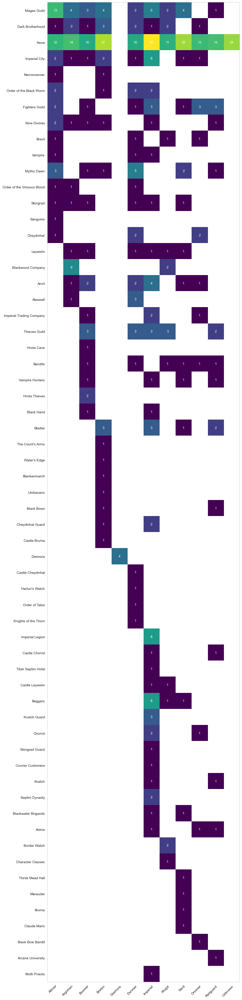

In [68]:
show_confusion_matrix(faction_characters, race_characters, figsize=(20,40))

**Factions versus Essential** - are any factions seemingly more important to the storyline than others?

/var/folders/z5/w7rdzhpn7xx4g1wy_6cb0stw0000gn/T/ipykernel_15564/290096267.py:15: RuntimeWarning: divide by zero encountered in log
  im = ax.imshow(np.log(D), cmap='viridis')


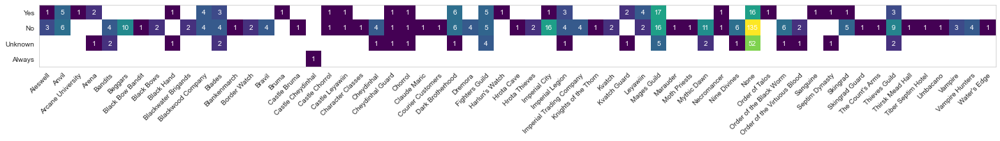

In [84]:
show_confusion_matrix( essential_characters,faction_characters, figsize=(20,40))

**Gender versus faction** - are there any factions that stand out by having much more men or women?

/var/folders/z5/w7rdzhpn7xx4g1wy_6cb0stw0000gn/T/ipykernel_15564/290096267.py:15: RuntimeWarning: divide by zero encountered in log
  im = ax.imshow(np.log(D), cmap='viridis')


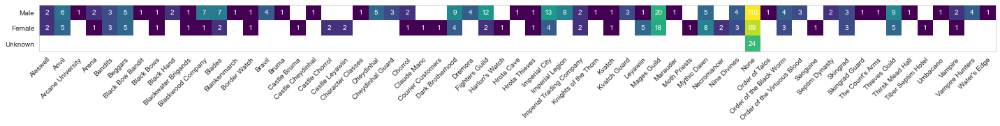

In [70]:
show_confusion_matrix(gender_characters, faction_characters, figsize=(20,40))

**Gender versus essential** - is there a disparity between which gender is considered most essential in quests?

/var/folders/z5/w7rdzhpn7xx4g1wy_6cb0stw0000gn/T/ipykernel_15564/290096267.py:15: RuntimeWarning: divide by zero encountered in log
  im = ax.imshow(np.log(D), cmap='viridis')


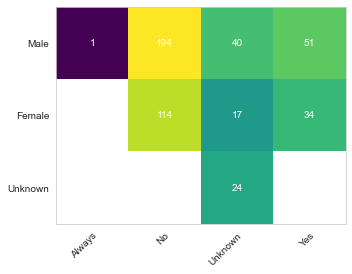

In [71]:
show_confusion_matrix(gender_characters, essential_characters, figsize=(5,5))

### Explore correlation between columns

In [72]:
# make a new df to categorize each column
gcc_df_cat = gcc_df.copy()

gcc_df_cat['faction']=gcc_df['faction'].astype('category').cat.codes
gcc_df_cat['essential']=gcc_df['essential'].astype('category').cat.codes
gcc_df_cat['race']=gcc_df['race'].astype('category').cat.codes
gcc_df_cat['gender']=gcc_df['gender'].astype('category').cat.codes

In [73]:
# are any columns actually correlated?
gcc_df_cat['essential'].corr(gcc_df_cat['community'])

-0.10435360792425209

In [74]:
gcc_df_cat

,race,gender,faction,essential,community
Ancotar,0,1,39,3,0
Angalmo,0,1,39,1,1
Ardaline,0,0,39,3,1
Arquen,0,0,26,3,2
Arterion,0,1,45,1,3
...,...,...,...,...,...
Blind Moth Priest,6,0,41,1,9
Conjurer (Oblivion),0,0,45,1,7
Highwayman (Oblivion),11,2,45,2,8
Mythic Dawn Agent,5,0,42,2,10


### use here for cleanup

## Moth Caretakers isn't working.. maybe manually add?

In [75]:
# faction_characters.keys()

for faction, chars in faction_characters.items():
    if faction=='Moth Priests':
        print(chars)

['Blind Moth Priest']


In [76]:
# nodes_attributes['Brother Hjar']
query_wikipedia('Brother Hjar')

'{{OblivionCharacters\n|image     = Brother Hjar.png\n|race      = Nord\n|gender    = Male\n|level     = PC-4\n|class     = Ancestor Moth Monk\n|faction   = Moth Caretakers\n|rank      = \n|essential = No\n|respawn   = No\n|RefID     = {{ID|00098332}}\n|Base ID   = {{ID|000982FC}}\n}}\n\'\'\'Brother Hjar\'\'\' is a [[Nords (Oblivion)|Nord]] living at the [[Temple of the Ancestor Moths (Oblivion)|Temple of the Ancestor Moths]]. The temple, which is tucked away in the [[Jerall Mountains]], is the home to [[Blind Moth Priest]]s who have lost their sight reading\xa0[[Elder Scroll (Oblivion)|Elder scrolls]]. Brother Hjar, as well as brothers [[Brother Holger|Holger]] and [[Brother Hridi|Hridi]], assist and protect the priest.\n\n==Interactions==\n===[[Turning a Blind Eye]]===\nThe [[The Gray Fox (Oblivion)|Gray Fox]] has discovered that the priests have secretly hidden [[Savilla\'s Stone]] away inside their catacombs. He sends a [[Hero of Kvatch|thief]] to go and recover the artifact. Broth

## pull dialogue from wiki pages for the next project